<a href="https://colab.research.google.com/github/rohailtaha/Fake-news-detection-lstm/blob/main/code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## IMPORT MODULES


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
import warnings
import tensorflow as tf
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Dropout
%matplotlib inline


warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## LOADING DATASET

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/fake news/train.csv')
df.head(10)

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1
5,5,Jackie Mason: Hollywood Would Love Trump if He...,Daniel Nussbaum,"In these trying times, Jackie Mason is the Voi...",0
6,6,Life: Life Of Luxury: Elton John’s 6 Favorite ...,NaN,Ever wonder how Britain’s most iconic pop pian...,1
7,7,Benoît Hamon Wins French Socialist Party’s Pre...,Alissa J. Rubin,"PARIS — France chose an idealistic, traditi...",0
8,8,Excerpts From a Draft Script for Donald Trump’...,NaN,Donald J. Trump is scheduled to make a highly ...,0
9,9,"A Back-Channel Plan for Ukraine and Russia, Co...",Megan Twohey and Scott Shane,A week before Michael T. Flynn resigned as nat...,0


In [ ]:
df['text'][0]


'House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It By Darrell Lucus on October 30, 2016 Subscribe Jason Chaffetz on the stump in American Fork, Utah ( image courtesy Michael Jolley, available under a Creative Commons-BY license) \nWith apologies to Keith Olbermann, there is no doubt who the Worst Person in The World is this week–FBI Director James Comey. But according to a House Democratic aide, it looks like we also know who the second-worst person is as well. It turns out that when Comey sent his now-infamous letter announcing that the FBI was looking into emails that may be related to Hillary Clinton’s email server, the ranking Democrats on the relevant committees didn’t hear about it from Comey. They found out via a tweet from one of the Republican committee chairmen. \nAs we now know, Comey notified the Republican chairmen and Democratic ranking members of the House Intelligence, Judiciary, and Oversight committees that his agency was reviewing emai

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20800 entries, 0 to 20799
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      20800 non-null  int64 
 1   title   20242 non-null  object
 2   author  18843 non-null  object
 3   text    20761 non-null  object
 4   label   20800 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 812.6+ KB


# DATA PRE PROCESSING

In [ ]:
# drop unnecessary columns
df = df.drop(columns=['id', 'title', 'author'], axis=1)
# drop null values
df = df.dropna(axis=0)
len(df)

20761

In [ ]:
# remove special characters and punctuations
df['clean_news'] = df['text'].str.lower()
df['clean_news'] = df['clean_news'].str.replace('[^A-Za-z0-9\s]', '')
df['clean_news'] = df['clean_news'].str.replace('\n', '')
df['clean_news'] = df['clean_news'].str.replace('\s+', ' ')
df['clean_news']

0        house dem aide we didnt even see comeys letter...
1        ever get the feeling your life circles the rou...
2        why the truth might get you fired october 29 2...
3        videos 15 civilians killed in single us airstr...
4        print an iranian woman has been sentenced to s...
                               ...                        
20795    rapper t i unloaded on black celebrities who m...
20796    when the green bay packers lost to the washing...
20797    the macys of today grew from the union of seve...
20798    nato russia to hold parallel exercises in balk...
20799     david swanson is an author activist journalis...
Name: clean_news, Length: 20761, dtype: object

In [ ]:
# remove stopwords
from nltk.corpus import stopwords
nltk.download('stopwords')
stop = stopwords.words('english')
df['clean_news'] = df['clean_news'].apply(lambda x: " ".join([word for word in x.split() if word not in stop]))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df.head(10)

NameError: ignored

In [ ]:
voc_size=5000
onehot_repr=[one_hot(words,voc_size)for words in df['clean_news']] 
onehot_repr

[[1287,
  4333,
  3516,
  3763,
  351,
  1545,
  2079,
  4879,
  1827,
  4589,
  4551,
  3965,
  1482,
  2361,
  4475,
  470,
  961,
  1827,
  4589,
  2265,
  1183,
  1932,
  4645,
  3113,
  766,
  4438,
  1202,
  1389,
  4600,
  2765,
  3817,
  27,
  4,
  2253,
  3499,
  3449,
  26,
  4529,
  4303,
  4733,
  40,
  2339,
  1690,
  1287,
  2071,
  3516,
  3989,
  2460,
  2166,
  2060,
  2801,
  26,
  3795,
  1172,
  2339,
  1483,
  2443,
  4879,
  3673,
  1169,
  1615,
  4789,
  398,
  4107,
  3756,
  4051,
  2885,
  4404,
  3256,
  4047,
  3095,
  4586,
  3763,
  353,
  2339,
  1238,
  4364,
  3875,
  258,
  737,
  3481,
  913,
  2060,
  2339,
  2842,
  737,
  913,
  2071,
  3256,
  1439,
  1287,
  2855,
  221,
  1964,
  4586,
  1699,
  4377,
  4789,
  325,
  4173,
  4265,
  1545,
  2762,
  3,
  3095,
  1677,
  4879,
  2207,
  1964,
  3481,
  2007,
  1827,
  4589,
  4917,
  4485,
  4529,
  2176,
  3875,
  1169,
  2039,
  3475,
  1169,
  865,
  1225,
  4789,
  3912,
  2775,
  1552,
  13

# **Embeding Representation**

In [ ]:
sent_length=500
embedded_docs=pad_sequences(onehot_repr,maxlen=sent_length, padding='post', truncating='post')
print(embedded_docs)

[[1287 4333 3516 ...    0    0    0]
 [2529 4593    8 ...    0    0    0]
 [3679 3398 4593 ... 3375 2167 1668]
 ...
 [1838 1850 2903 ...    0    0    0]
 [3973  741 4528 ...    0    0    0]
 [ 497 2456 2814 ... 3712 4598 2582]]


In [ ]:
## Creating model
embedding_vector_features=40
model=Sequential()
model.add(Embedding(voc_size,embedding_vector_features,input_length=sent_length))
model.add(Bidirectional(LSTM(100)))
model.add(Dropout(0.3))
model.add(Dense(1,activation='sigmoid'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 40)           200000    
                                                                 
 bidirectional (Bidirectiona  (None, 200)              112800    
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 200)               0         
                                                                 
 dense (Dense)               (None, 1)                 201       
                                                                 
Total params: 313,001
Trainable params: 313,001
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
import numpy as np
X_final=np.array(embedded_docs)
y_final=np.array(df['label'])

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.33, random_state=42)

In [ ]:
# train the model
history = model.fit(X_train, y_train, epochs=4, batch_size=256, validation_data=(X_test, y_test))

Epoch 1/4
55/55 [==============================] - 268s 5s/step - loss: 0.3532 - accuracy: 0.8542 - val_loss: 0.2330 - val_accuracy: 0.9073
Epoch 2/4
55/55 [==============================] - 261s 5s/step - loss: 0.1587 - accuracy: 0.9451 - val_loss: 0.2051 - val_accuracy: 0.9189
Epoch 3/4
55/55 [==============================] - 253s 5s/step - loss: 0.1839 - accuracy: 0.9343 - val_loss: 0.2022 - val_accuracy: 0.9250
Epoch 4/4
55/55 [==============================] - 239s 4s/step - loss: 0.0914 - accuracy: 0.9694 - val_loss: 0.2026 - val_accuracy: 0.9286


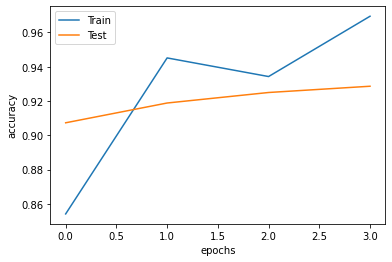

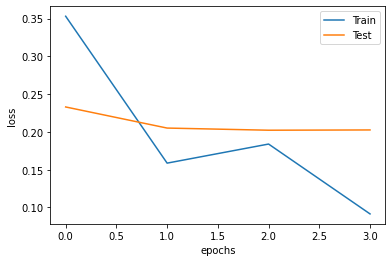

In [ ]:
# visualize the results
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend(['Train', 'Test'])
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['Train', 'Test'])
plt.show()